In [1]:
%pip install keras_preprocessing
%pip install seaborn


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 2.4 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
import PIL

from keras_preprocessing.image import ImageDataGenerator

from pathlib import Path
import random

import matplotlib.cm as cm
import cv2
import seaborn as sns

sns.set_style('darkgrid')

# Metrics
from sklearn.metrics import classification_report, confusion_matrix
import itertools


!wget https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/extras/helper_functions.py

from helper_functions import create_tensorboard_callback, plot_loss_curves, unzip_data, compare_historys, walk_through_dir, pred_and_plot

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: l

--2023-09-25 10:40:19--  https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/extras/helper_functions.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 10246 (10K) [text/plain]
Saving to: ‘helper_functions.py’

helper_functions.py 100%[===================>]  10.01K  --.-KB/s    in 0s      

2023-09-25 10:40:19 (67.8 MB/s) - ‘helper_functions.py’ saved [10246/10246]



In [3]:
BATCH_SIZE = 32
IMAGE_SIZE = (224,224)

In [4]:
train_root = Path("/kaggle/input/100-bird-species/train")
valid_root = Path("/kaggle/input/100-bird-species/valid")
test_root = Path("/kaggle/input/100-bird-species/test")

In [5]:
walk_through_dir(train_root)

There are 525 directories and 0 images in '/kaggle/input/100-bird-species/train'.
There are 0 directories and 159 images in '/kaggle/input/100-bird-species/train/DALMATIAN PELICAN'.
There are 0 directories and 172 images in '/kaggle/input/100-bird-species/train/BLACK BREASTED PUFFBIRD'.
There are 0 directories and 138 images in '/kaggle/input/100-bird-species/train/WATTLED CURASSOW'.
There are 0 directories and 187 images in '/kaggle/input/100-bird-species/train/AMERICAN WIGEON'.
There are 0 directories and 162 images in '/kaggle/input/100-bird-species/train/CARMINE BEE-EATER'.
There are 0 directories and 153 images in '/kaggle/input/100-bird-species/train/GAMBELS QUAIL'.
There are 0 directories and 155 images in '/kaggle/input/100-bird-species/train/UMBRELLA BIRD'.
There are 0 directories and 155 images in '/kaggle/input/100-bird-species/train/AMERICAN KESTREL'.
There are 0 directories and 133 images in '/kaggle/input/100-bird-species/train/AMERICAN GOLDFINCH'.
There are 0 directories

In [6]:
walk_through_dir(valid_root)

There are 525 directories and 0 images in '/kaggle/input/100-bird-species/valid'.
There are 0 directories and 5 images in '/kaggle/input/100-bird-species/valid/DALMATIAN PELICAN'.
There are 0 directories and 5 images in '/kaggle/input/100-bird-species/valid/BLACK BREASTED PUFFBIRD'.
There are 0 directories and 5 images in '/kaggle/input/100-bird-species/valid/WATTLED CURASSOW'.
There are 0 directories and 5 images in '/kaggle/input/100-bird-species/valid/AMERICAN WIGEON'.
There are 0 directories and 5 images in '/kaggle/input/100-bird-species/valid/CARMINE BEE-EATER'.
There are 0 directories and 5 images in '/kaggle/input/100-bird-species/valid/GAMBELS QUAIL'.
There are 0 directories and 5 images in '/kaggle/input/100-bird-species/valid/UMBRELLA BIRD'.
There are 0 directories and 5 images in '/kaggle/input/100-bird-species/valid/AMERICAN KESTREL'.
There are 0 directories and 5 images in '/kaggle/input/100-bird-species/valid/AMERICAN GOLDFINCH'.
There are 0 directories and 5 images in '

In [7]:
walk_through_dir(test_root)

There are 525 directories and 0 images in '/kaggle/input/100-bird-species/test'.
There are 0 directories and 5 images in '/kaggle/input/100-bird-species/test/DALMATIAN PELICAN'.
There are 0 directories and 5 images in '/kaggle/input/100-bird-species/test/BLACK BREASTED PUFFBIRD'.
There are 0 directories and 5 images in '/kaggle/input/100-bird-species/test/WATTLED CURASSOW'.
There are 0 directories and 5 images in '/kaggle/input/100-bird-species/test/AMERICAN WIGEON'.
There are 0 directories and 5 images in '/kaggle/input/100-bird-species/test/CARMINE BEE-EATER'.
There are 0 directories and 5 images in '/kaggle/input/100-bird-species/test/GAMBELS QUAIL'.
There are 0 directories and 5 images in '/kaggle/input/100-bird-species/test/UMBRELLA BIRD'.
There are 0 directories and 5 images in '/kaggle/input/100-bird-species/test/AMERICAN KESTREL'.
There are 0 directories and 5 images in '/kaggle/input/100-bird-species/test/AMERICAN GOLDFINCH'.
There are 0 directories and 5 images in '/kaggle/in

In [8]:
birda_df=pd.read_csv("/kaggle/input/100-bird-species/birds.csv")

print(f"Columns of the dataframe are {birda_df.columns}")
print(f"Number of images in train data = {birda_df[birda_df['data set']=='train'].shape[0]}")
print(f"Number of images in valid data = {birda_df[birda_df['data set']=='valid'].shape[0]}")
print(f"Number of images in test data = {birda_df[birda_df['data set']=='test'].shape[0]}")

Columns of the dataframe are Index(['class id', 'filepaths', 'labels', 'data set', 'scientific name'], dtype='object')
Number of images in train data = 84635
Number of images in valid data = 2625
Number of images in test data = 2625


In [9]:
trainData=birda_df[birda_df["data set"]=="train"]
validData=birda_df[birda_df["data set"]=="valid"]
testData=birda_df[birda_df["data set"]=="test"]

base = "/kaggle/input/100-bird-species/"

trainRealPaths=[base+path for path in trainData["filepaths"]]
validRealPaths=[base+path for path in validData["filepaths"]]
testRealPaths=[base+path for path in testData["filepaths"]]

In [10]:
# discovering if the data is balanced

train_label_counts = trainData['labels'].value_counts()
pd.DataFrame(train_label_counts)


,labels
RUFOUS TREPE,263
HOUSE FINCH,248
D-ARNAUDS BARBET,233
OVENBIRD,233
ASIAN GREEN BEE EATER,220
...,...
NORTHERN RED BISHOP,130
SNOWY PLOVER,130
PATAGONIAN SIERRA FINCH,130
EURASIAN GOLDEN ORIOLE,130


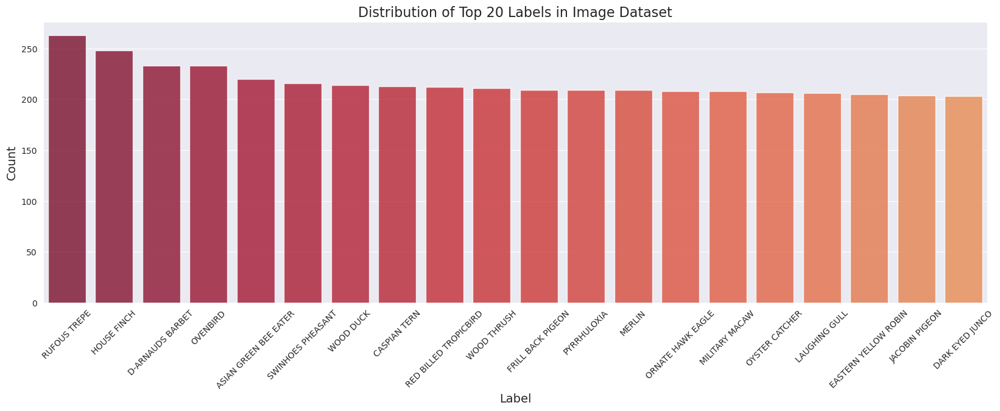

In [11]:
plt.figure(figsize=(20, 6))
sns.barplot(x=train_label_counts[:20].index, y=train_label_counts[:20].values, alpha=0.8, palette=sns.color_palette("YlOrRd_r",40))
plt.title('Distribution of Top 20 Labels in Image Dataset', fontsize=16)
plt.xlabel('Label', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(rotation=45)
plt.show()


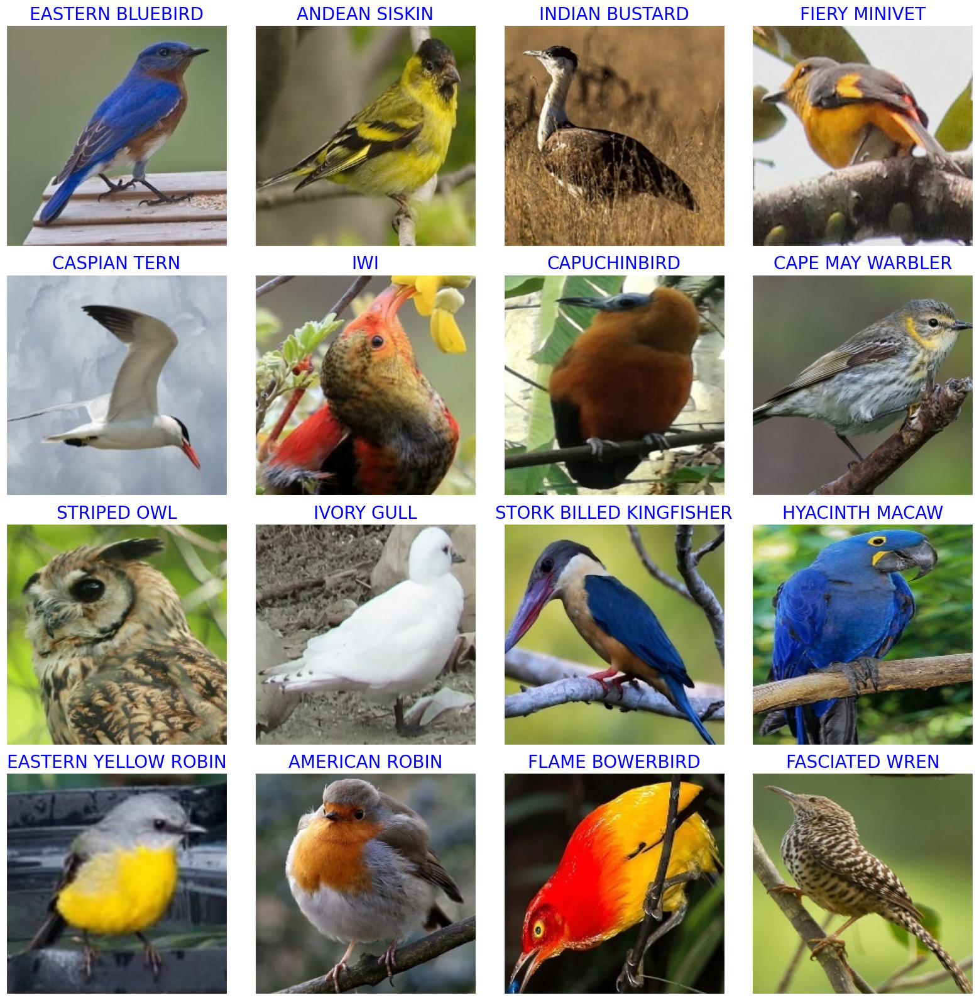

In [12]:
random_index = np.random.randint(0, len(trainData), 16)
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(16, 16),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(trainRealPaths[random_index[i]]))
    ax.set_title(trainData.labels[random_index[i]],color="blue",fontsize=20)
plt.tight_layout()
plt.show()

In [13]:
def compute_ela_cv(path, quality):
    temp_filename = 'temp_file_name.jpeg'
    SCALE = 15
    orig_img = cv2.imread(path)
    orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)
    
    cv2.imwrite(temp_filename, orig_img, [cv2.IMWRITE_JPEG_QUALITY, quality])

    # read compressed image
    compressed_img = cv2.imread(temp_filename)

    # get absolute difference between img1 and img2 and multiply by scale
    diff = SCALE * cv2.absdiff(orig_img, compressed_img)
    return diff

def convert_to_ela_image(path, quality):
    temp_filename = 'temp_file_name.jpeg'
    ela_filename = 'temp_ela.png'
    image = PIL.Image.open(path).convert('RGB')
    image.save(temp_filename, 'JPEG', quality = quality)
    temp_image = PIL.Image.open(temp_filename)

    ela_image = PIL.ImageChops.difference(image, temp_image)

    extrema = ela_image.getextrema()
    max_diff = max([ex[1] for ex in extrema])
    if max_diff == 0:
        max_diff = 1

    scale = 255.0 / max_diff
    ela_image = PIL.ImageEnhance.Brightness(ela_image).enhance(scale)
    
    return ela_image

def random_sample(path, extension=None):
    if extension:
        items = Path(path).glob(f'*.{extension}')
    else:
        items = Path(path).glob(f'*')
        
    items = list(items)
        
    p = random.choice(items)
    return p.as_posix()

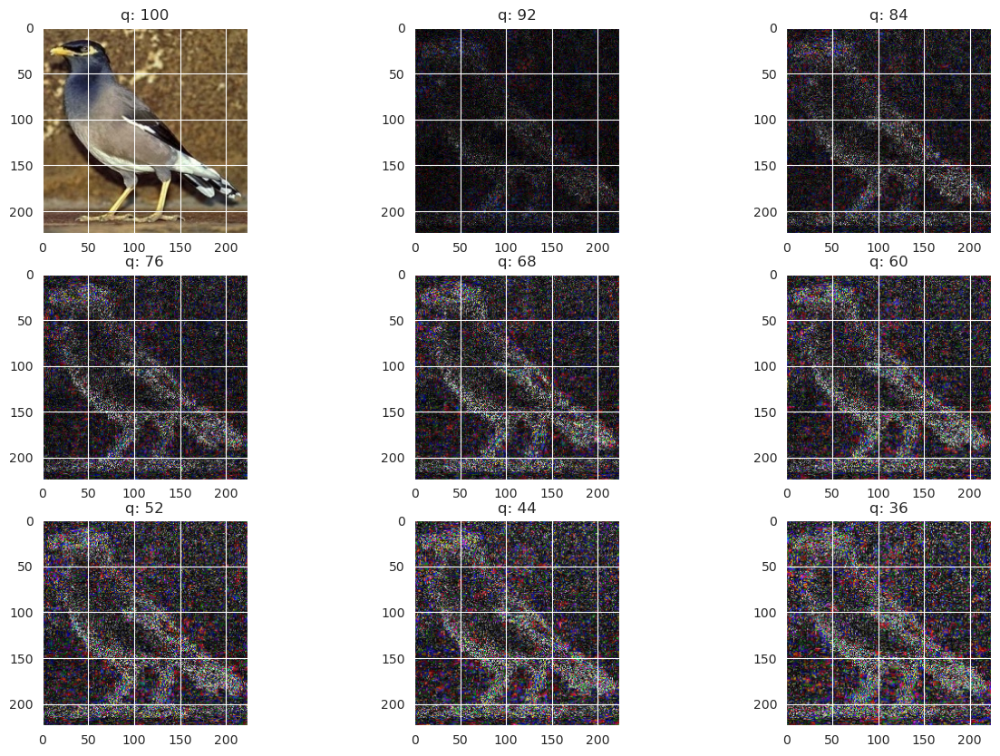

In [14]:
rnd_idx=np.random.randint(0,len(trainData))
trainRealPaths[rnd_idx].split('/')[:-1]


p = random_sample('/'.join(trainRealPaths[rnd_idx].split('/')[:-1]))
orig = cv2.imread(p)
orig = cv2.cvtColor(orig, cv2.COLOR_BGR2RGB) / 255.0
init_val = 100
columns = 3
rows = 3

fig=plt.figure(figsize=(15, 10))
for i in range(1, columns*rows +1):
    quality=init_val - (i-1) * 8
    img = compute_ela_cv(path=p, quality=quality)
    if i == 1:
        img = orig.copy()
    ax = fig.add_subplot(rows, columns, i) 
    ax.title.set_text(f'q: {quality}')
    plt.imshow(img)
plt.show()

In [15]:
# Rescale
train_datagen = ImageDataGenerator(rescale = 1./255)
test_datagen = ImageDataGenerator(rescale = 1./255)
valid_datagen = ImageDataGenerator(rescale = 1./255)

# data transfer from directories to batches
train_data = train_datagen.flow_from_directory(directory = train_root,
                                               batch_size= BATCH_SIZE,
                                               target_size= IMAGE_SIZE,
                                               class_mode = "categorical")

test_data = test_datagen.flow_from_directory(directory = valid_root,
                                               batch_size = BATCH_SIZE,
                                               target_size = IMAGE_SIZE,
                                               class_mode = "categorical")

val_data = valid_datagen.flow_from_directory(directory = test_root,
                                               batch_size = BATCH_SIZE,
                                               target_size = IMAGE_SIZE,
                                               class_mode = "categorical")

Found 84635 images belonging to 525 classes.
Found 2625 images belonging to 525 classes.
Found 2625 images belonging to 525 classes.


In [16]:
# Create checkpoint callback
checkpoint_path = "birds_classification_model_checkpoint"
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(checkpoint_path,
                                      save_weights_only=True,
                                      monitor="val_accuracy",
                                      save_best_only=True)

# Setup EarlyStopping callback to stop training if model's val_loss doesn't improve for 3 epochs
early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "val_loss", # watch the val loss metric
                               patience = 5,
                               restore_best_weights = True) # if val loss decreases for 3 epochs in a row, stop training

reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6)

In [17]:
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip(mode="horizontal", seed=42),
    tf.keras.layers.RandomRotation(factor=0.05, seed=42),
    tf.keras.layers.RandomZoom(0.05, seed=42),
])

In [18]:
base_model = tf.keras.applications.InceptionV3(include_top= False,)

# 2. Freeze the base model
base_model.trainable = False
model_0=tf.keras.Sequential([
    tf.keras.layers.Input(shape =(224,224,3), name = "input-layer"),
    data_augmentation,
    base_model,
    tf.keras.layers.GlobalAveragePooling2D(name = "global_average_pooling_layer"),
    tf.keras.layers.Dense(525, activation = "softmax", name = "output-layer")
])


# 9. Compile the model
model_0.compile(loss = "categorical_crossentropy",
                optimizer = tf.keras.optimizers.Adam(learning_rate = 0.01),
                metrics = ["accuracy"])




87910968/87910968 [==============================] - 1s 0us/step


In [19]:
model_0.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (None, 224, 224, 3)       0         
                                                                 
 inception_v3 (Functional)   (None, None, None, 2048)  21802784  
                                                                 
 global_average_pooling_laye  (None, 2048)             0         
 r (GlobalAveragePooling2D)                                      
                                                                 
 output-layer (Dense)        (None, 525)               1075725   
                                                                 
Total params: 22,878,509
Trainable params: 1,075,725
Non-trainable params: 21,802,784
_________________________________________________________________


In [20]:
history = model_0.fit(train_data,
                                 epochs=20,
                                 steps_per_epoch = len(train_data),
                                 validation_data = val_data,
                                 validation_steps = int(0.25*len(val_data)),callbacks=[
        early_stopping,
        create_tensorboard_callback("training_logs", 
                                    "bird_classification"),
        checkpoint_callback,
        reduce_lr
    ])

Saving TensorBoard log files to: training_logs/bird_classification/20230925-104115
Epoch 1/20
2645/2645 [==============================] - 768s 286ms/step - loss: 11.3877 - accuracy: 0.4517 - val_loss: 6.3600 - val_accuracy: 0.6703 - lr: 0.0100
Epoch 2/20
2645/2645 [==============================] - 228s 86ms/step - loss: 9.3159 - accuracy: 0.6241 - val_loss: 6.0686 - val_accuracy: 0.7391 - lr: 0.0100
Epoch 3/20
2645/2645 [==============================] - 206s 78ms/step - loss: 8.5124 - accuracy: 0.6823 - val_loss: 6.1285 - val_accuracy: 0.7625 - lr: 0.0100
Epoch 4/20
2645/2645 [==============================] - 211s 80ms/step - loss: 7.9154 - accuracy: 0.7166 - val_loss: 5.1675 - val_accuracy: 0.8078 - lr: 0.0100
Epoch 5/20
2645/2645 [==============================] - 205s 77ms/step - loss: 7.5274 - accuracy: 0.7405 - val_loss: 5.5310 - val_accuracy: 0.8172 - lr: 0.0100
Epoch 6/20
2645/2645 [==============================] - 204s 77ms/step - loss: 7.1156 - accuracy: 0.7601 - val_loss

In [21]:
for indices in zip(range(195,224),range(224,253),range(253,282), range(282, 311)):
    for idx in indices:
        print(f"  {idx:3}: {base_model.layers[idx].name:22}", end="")
    print()

  195: activation_59           224: activation_60           253: conv2d_81               282: activation_89         
  196: mixed6                  225: activation_63           254: batch_normalization_77  283: conv2d_86             
  197: conv2d_64               226: activation_68           255: batch_normalization_81  284: conv2d_90             
  198: batch_normalization_64  227: activation_69           256: activation_77           285: batch_normalization_86
  199: activation_64           228: mixed7                  257: activation_81           286: batch_normalization_90
  200: conv2d_65               229: conv2d_72               258: conv2d_78               287: activation_86         
  201: batch_normalization_65  230: batch_normalization_72  259: conv2d_79               288: activation_90         
  202: activation_65           231: activation_72           260: conv2d_82               289: conv2d_87             
  203: conv2d_61               232: conv2d_73               261:

In [22]:
base_model.trainable = True

# Un-freeze last 22 layers
for layer in base_model.layers[:-22]:
  layer.trainable = False

#Reduce learning rate (it's better to reduce lr with factor 10 before fine tuning)
# Recompile (we have to compile model every time there is a change)
model_0.compile(loss = "categorical_crossentropy",
                optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0001),
                metrics = ["accuracy"])

In [23]:
model_0.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (None, None, None, None)  0         
                                                                 
 inception_v3 (Functional)   (None, None, None, 2048)  21802784  
                                                                 
 global_average_pooling_laye  (None, 2048)             0         
 r (GlobalAveragePooling2D)                                      
                                                                 
 output-layer (Dense)        (None, 525)               1075725   
                                                                 
Total params: 22,878,509
Trainable params: 3,895,821
Non-trainable params: 18,982,688
_________________________________________________________________


In [24]:
history_tuned = model_0.fit(train_data,
                                 epochs=40,
                                 steps_per_epoch = len(train_data),
                                 validation_data = val_data,
                                 validation_steps = int(0.25*len(val_data)),callbacks=[
        early_stopping,
        create_tensorboard_callback("training_logs", 
                                    "bird_classification"),
        checkpoint_callback,
        reduce_lr
    ])

Saving TensorBoard log files to: training_logs/bird_classification/20230925-120742
Epoch 1/40
2645/2645 [==============================] - 213s 77ms/step - loss: 1.5504 - accuracy: 0.8970 - val_loss: 1.7827 - val_accuracy: 0.9078 - lr: 1.0000e-04
Epoch 2/40
2645/2645 [==============================] - 204s 77ms/step - loss: 1.1533 - accuracy: 0.9101 - val_loss: 1.5867 - val_accuracy: 0.9000 - lr: 1.0000e-04
Epoch 3/40
2645/2645 [==============================] - 206s 78ms/step - loss: 0.9109 - accuracy: 0.9206 - val_loss: 1.4401 - val_accuracy: 0.9172 - lr: 1.0000e-04
Epoch 4/40
2645/2645 [==============================] - 203s 77ms/step - loss: 0.7820 - accuracy: 0.9265 - val_loss: 1.0405 - val_accuracy: 0.9297 - lr: 1.0000e-04
Epoch 5/40
2645/2645 [==============================] - 198s 75ms/step - loss: 0.6591 - accuracy: 0.9333 - val_loss: 0.9621 - val_accuracy: 0.9156 - lr: 1.0000e-04
Epoch 6/40
2645/2645 [==============================] - 212s 80ms/step - loss: 0.5645 - accuracy:

In [25]:
model_0.save("Birds_Classification_InceptionV3.h5")

In [26]:
results = model_0.evaluate(test_data, verbose=0)

print("    Test Loss: {:.5f}".format(results[0]))
print("Test Accuracy: {:.2f}%".format(results[1] * 100))

    Test Loss: 0.96572
Test Accuracy: 92.30%


In [27]:
results = model_0.evaluate(val_data, verbose=0)

print("    Validation Loss: {:.5f}".format(results[0]))
print("Validation Accuracy: {:.2f}%".format(results[1] * 100))

    Validation Loss: 0.62840
Validation Accuracy: 94.44%


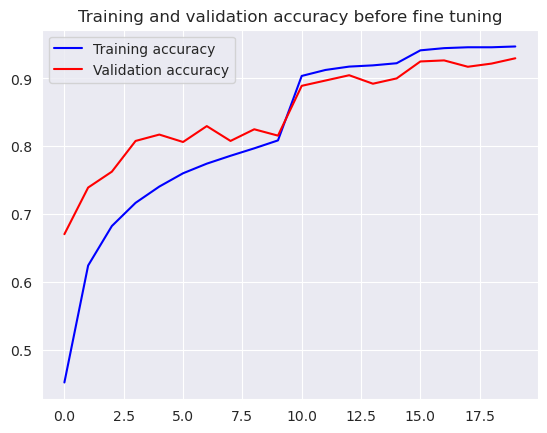

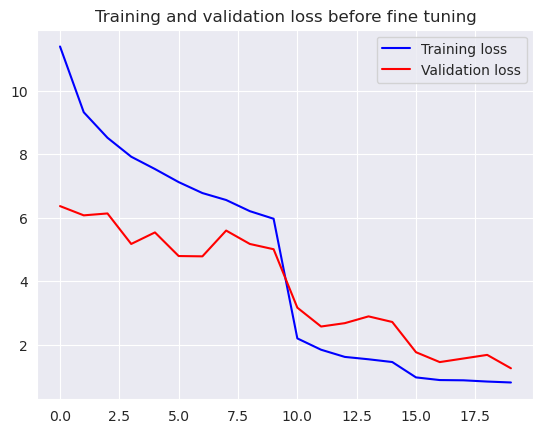

In [28]:
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(accuracy))
plt.plot(epochs, accuracy, 'b', label='Training accuracy')
plt.plot(epochs, val_accuracy, 'r', label='Validation accuracy')

plt.title('Training and validation accuracy before fine tuning')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')

plt.title('Training and validation loss before fine tuning')
plt.legend()
plt.show()

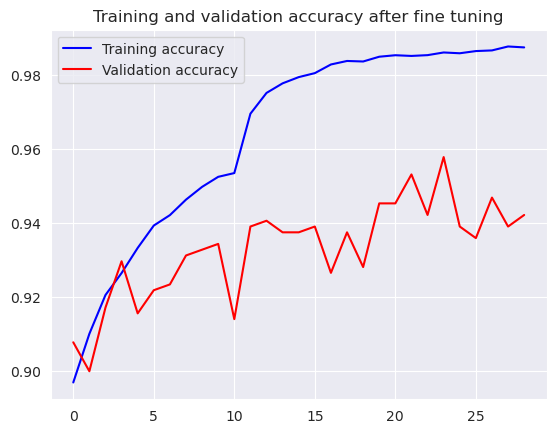

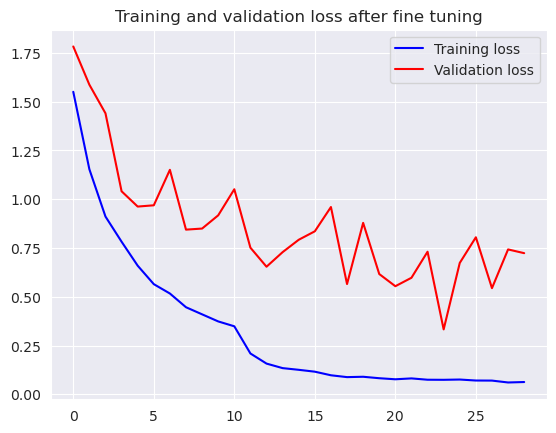

In [29]:
accuracy = history_tuned.history['accuracy']
val_accuracy = history_tuned.history['val_accuracy']

loss = history_tuned.history['loss']
val_loss = history_tuned.history['val_loss']

epochs = range(len(accuracy))
plt.plot(epochs, accuracy, 'b', label='Training accuracy')
plt.plot(epochs, val_accuracy, 'r', label='Validation accuracy')

plt.title('Training and validation accuracy after fine tuning')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')

plt.title('Training and validation loss after fine tuning')
plt.legend()
plt.show()

In [30]:
labels = (test_data.class_indices)
labels = dict((v,k) for k,v in labels.items())

1/1 [==============================] - 0s 30ms/step


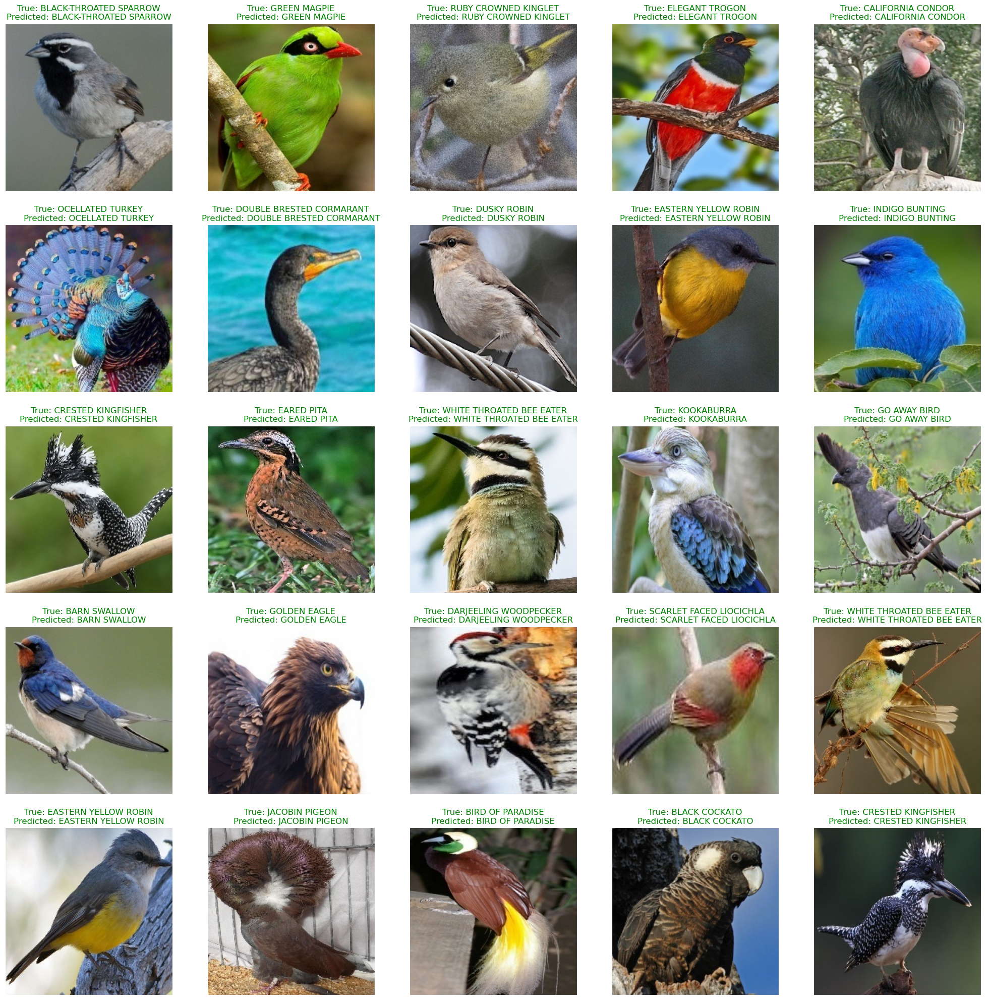

<Figure size 640x480 with 0 Axes>

In [31]:
firstdim=np.random.randint(0,82,25)
thirddim=np.random.randint(0,31,25)

fig, axes = plt.subplots(nrows=5, ncols=5, figsize=(25, 25),
                        subplot_kw={'xticks': [], 'yticks': []})


for i, ax in enumerate(axes.flat):
    ax.imshow(test_data[firstdim[i]][0][thirddim[i]])
    truelabel=np.argmax(test_data[firstdim[i]][1][thirddim[i]])
    image = tf.keras.preprocessing.image.img_to_array(test_data[firstdim[i]][0][thirddim[i]])
    image = np.expand_dims(image, axis=0)
    prediction = np.argmax(model_0.predict(image))
    if truelabel == prediction:
        color = "green"
    else:
        color = "red"
    ax.set_title(f"True: {labels[truelabel]}\nPredicted: {labels[prediction]}", color=color)
plt.show()
plt.tight_layout()

In [32]:
y_test=[]
pred=[]

cur=1

for _ in range(2625):
    img, label = test_data.next()
    y_test.append(np.argmax(label))
    pred.append(np.argmax(model_0.predict(img)))
    print(cur)
    cur+=1

1/1 [==============================] - 0s 68ms/step
1
1/1 [==============================] - 0s 47ms/step
2
1/1 [==============================] - 0s 47ms/step
3
1/1 [==============================] - 0s 34ms/step
4
1/1 [==============================] - 0s 34ms/step
5
1/1 [==============================] - 0s 38ms/step
6
1/1 [==============================] - 0s 34ms/step
7
1/1 [==============================] - 0s 34ms/step
8
1/1 [==============================] - 0s 33ms/step
9
1/1 [==============================] - 0s 44ms/step
10
1/1 [==============================] - 0s 34ms/step
11
1/1 [==============================] - 0s 34ms/step
12
1/1 [==============================] - 0s 34ms/step
13
1/1 [==============================] - 0s 34ms/step
14
1/1 [==============================] - 0s 34ms/step
15
1/1 [==============================] - 0s 34ms/step
16
1/1 [==============================] - 0s 37ms/step
17
1/1 [==============================] - 0s 34ms/step
18
1/1 [==============

In [33]:
report = classification_report(y_test, pred, output_dict=True)
df = pd.DataFrame(report).transpose()
df

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.

,precision,recall,f1-score,support
0,0.666667,0.500000,0.571429,4.000000
1,1.000000,0.666667,0.800000,6.000000
2,1.000000,0.750000,0.857143,4.000000
3,1.000000,1.000000,1.000000,6.000000
4,1.000000,0.800000,0.888889,5.000000
...,...,...,...,...
2854,0.000000,0.000000,0.000000,0.000000
3173,0.000000,0.000000,0.000000,0.000000
accuracy,0.780952,0.780952,0.780952,0.780952
macro avg,0.534859,0.444963,0.472845,2625.000000
